In [1]:
import pandas as pd
from bifacial_peak_shaving import *
from utils import *
pd.options.plotting.backend='plotly'

# Data

In [2]:
dir = './Data/'

## Load

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 8760 entries, 2022-01-01 00:00:00 to 2022-12-31 23:00:00
Freq: H
Data columns (total 1 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Load (kW)  8760 non-null   float64
dtypes: float64(1)
memory usage: 136.9 KB
None
                     Load (kW)
2022-01-01 00:00:00    20.3575
2022-01-01 01:00:00    20.1600
2022-01-01 02:00:00    19.9900
2022-01-01 03:00:00    19.8775
2022-01-01 04:00:00    19.7850
...                        ...
2022-12-31 19:00:00    20.5775
2022-12-31 20:00:00    20.6700
2022-12-31 21:00:00    20.8125
2022-12-31 22:00:00    20.8925
2022-12-31 23:00:00    20.7200

[8760 rows x 1 columns]


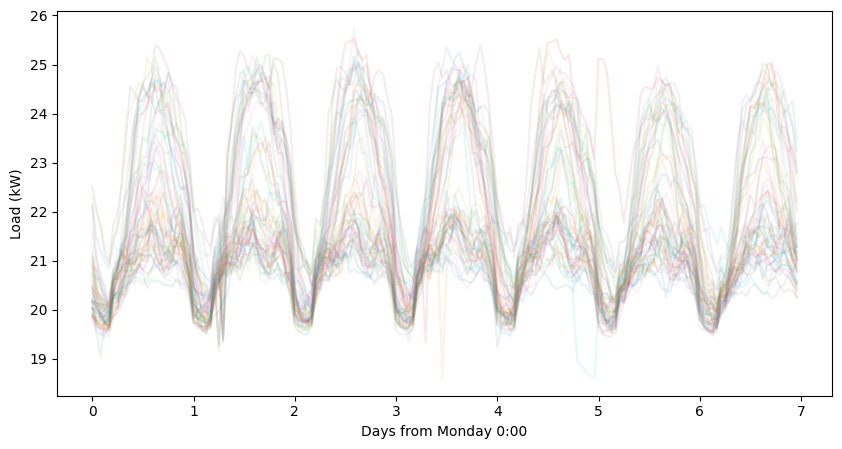

In [3]:
load = pd.read_csv( dir+'verizon_west_excelsior_profile_load_solarTMY_TS2.csv',
                    comment='#',
                    index_col=0,
                    parse_dates=True,
                    usecols=[0,1])
load = load.resample('1h').mean()
load.columns = ['Load (kW)']
load.loc['2022-3-13'] = load.loc['2022-3-12'].values
load.loc['2022-6-22'] = load.loc['2022-6-20'].values
load.loc['2022-6-23'] = load.loc['2022-6-21'].values
load.loc['2022-8-25'] = load.loc['2022-8-23'].values
load.loc['2022-8-26'] = load.loc['2022-8-24'].values

load = load + 16
#load[load['Load (kW)']<0] = 0

print(load.info())
print(load)
plot_weekly(load['Load (kW)'],interval_min=60)

In [4]:
load.plot()

## Solar

- 7 kWp, TMY

- Net zero capacity

  - $capacity[kWp] = production[kWh] \times yield [\frac{kWh}{kWp}]^{-1}$

In [5]:
solar_angles = ['s20','w20','w90','s20w90']
solar = pd.concat(( 
                    pd.read_csv(dir+'Solar/Modelled/lemooreCA_7kwp_s20deg.csv',index_col=0),
                    pd.read_csv(dir+'Solar/Modelled/lemooreCA_7kwp_w20deg.csv',index_col=0),
                    pd.read_csv(dir+'Solar/Modelled/lemooreCA_7kwp_w90deg.csv',index_col=0),
                    pd.read_csv(dir+'Solar/Modelled/lemooreCA_3.5kwp_s20deg_3.5kwp_w90deg.csv',index_col=0),
                   ),
                  axis=1)
solar.index = pd.date_range('1900-1-1 0:00',periods=8760,freq='1h')
solar.columns = solar_angles
net_zero_capacity = load['Load (kW)'].sum() / (solar.s20.sum()/7) # load=production / yield
solar = solar * net_zero_capacity/7 # scale to net 0
#solar = solar * 2 # randomly scale up
solar.describe()

,s20,w20,w90,s20w90
count,8760.000000,8760.000000,8760.000000,8760.000000
mean,21.491948,19.212420,20.554361,21.040605
std,30.344166,27.116365,27.020427,26.796418
min,-0.074771,-0.074771,-0.068144,-0.062538
25%,-0.008845,-0.008845,-0.008845,-0.008845
50%,-0.008845,-0.008845,-0.008845,-0.008845
75%,42.495574,37.665061,39.587762,45.351686
max,122.623169,118.137580,103.529409,95.271362


In [6]:
solar.loc['1900-8-25':'1900-8-27'].plot()

In [7]:
# for col in solar:
#     plot_daily(solar[col],title=col,interval_min=60)

## Plot weekly

In [8]:
solar.index = load.index
df = pd.concat((load,solar),axis=1)
df.columns = ['load'] + ['solar_'+x for x in solar.columns]
for angle in solar.columns:
    df[f'netload_{angle}'] = df['load'] - solar[angle]
df    

,load,solar_s20,solar_w20,solar_w90,solar_s20w90,netload_s20,netload_w20,netload_w90,netload_s20w90
2022-01-01 00:00:00,20.3575,-0.008845,-0.008845,-0.008845,-0.008845,20.366345,20.366345,20.366345,20.366345
2022-01-01 01:00:00,20.1600,-0.008845,-0.008845,-0.008845,-0.008845,20.168845,20.168845,20.168845,20.168845
2022-01-01 02:00:00,19.9900,-0.008845,-0.008845,-0.008845,-0.008845,19.998845,19.998845,19.998845,19.998845
2022-01-01 03:00:00,19.8775,-0.008845,-0.008845,-0.008845,-0.008845,19.886345,19.886345,19.886345,19.886345
2022-01-01 04:00:00,19.7850,-0.008845,-0.008845,-0.008845,-0.008845,19.793845,19.793845,19.793845,19.793845
...,...,...,...,...,...,...,...,...,...
2022-12-31 19:00:00,20.5775,-0.008845,-0.008845,-0.008845,-0.008845,20.586345,20.586345,20.586345,20.586345
2022-12-31 20:00:00,20.6700,-0.008845,-0.008845,-0.008845,-0.008845,20.678845,20.678845,20.678845,20.678845
2022-12-31 21:00:00,20.8125,-0.008845,-0.008845,-0.008845,-0.008845,20.821345,20.821345,20.821345,20.821345
2022-12-31 22:00:00,20.8925,-0.008845,-0.008845,-0.008845,-0.008845,20.901345,20.901345,20.901345,20.901345


load v s20

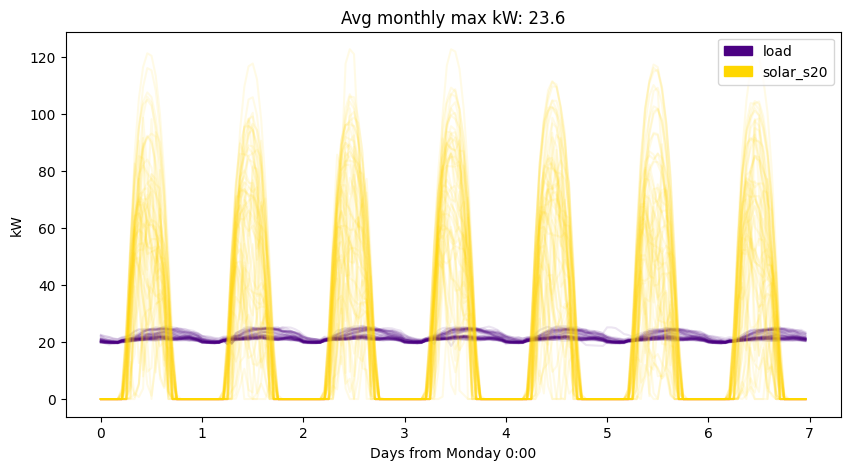

In [9]:
l = df['load']
s = df['solar_s20']
avg_monthly_max = (l - s).resample('1M').max().mean()  
plot_weekly((l,s),f'Avg monthly max kW: {avg_monthly_max:.1f}',ylabel='kW')

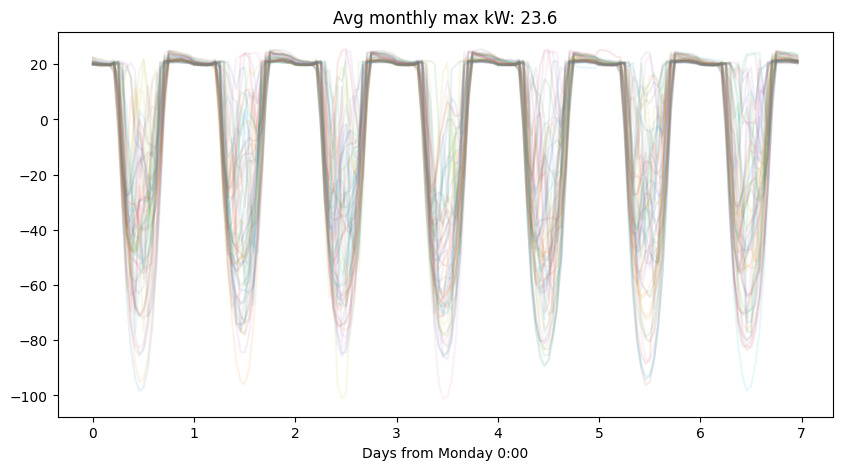

In [10]:
l = df['load']
s = df['solar_s20']
avg_monthly_max = (l - s).resample('1M').max().mean()  
plot_weekly(l-s,f'Avg monthly max kW: {avg_monthly_max:.1f}',ylabel='kW')

load v w20

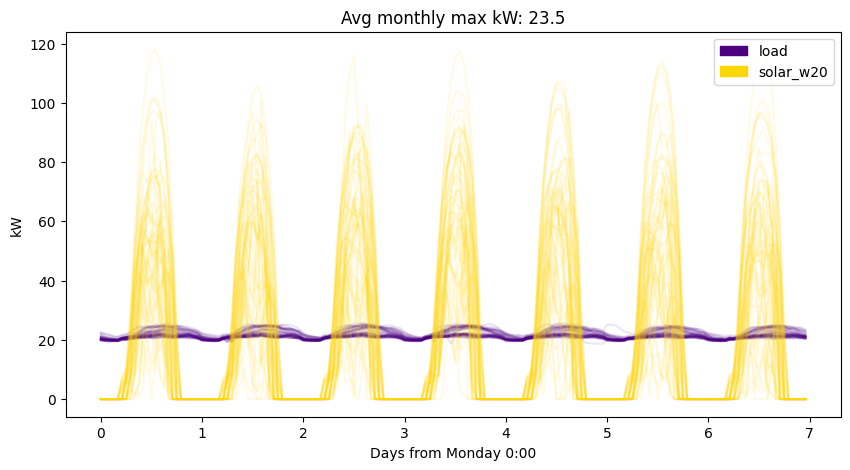

In [11]:
l = df['load']
s = df['solar_w20']
avg_monthly_max = (l - s).resample('1M').max().mean()  
plot_weekly((l,s),f'Avg monthly max kW: {avg_monthly_max:.1f}',ylabel='kW')

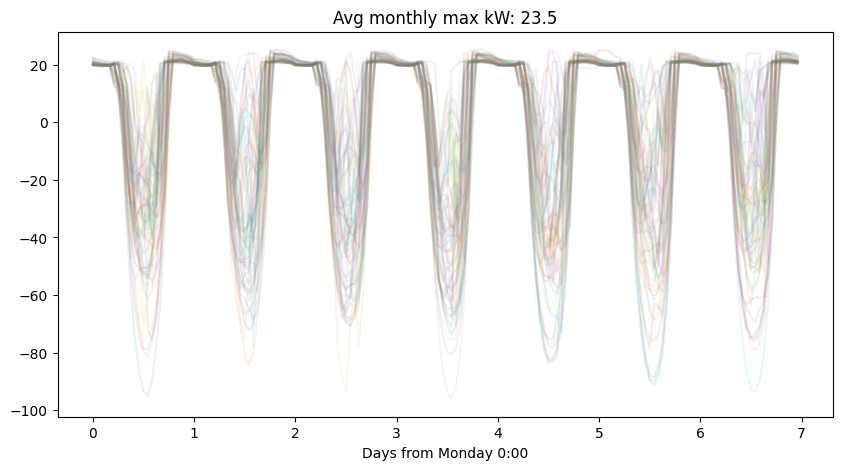

In [12]:
l = df['load']
s = df['solar_w20']
avg_monthly_max = (l - s).resample('1M').max().mean()  
plot_weekly(l-s,f'Avg monthly max kW: {avg_monthly_max:.1f}',ylabel='kW')

load v w90

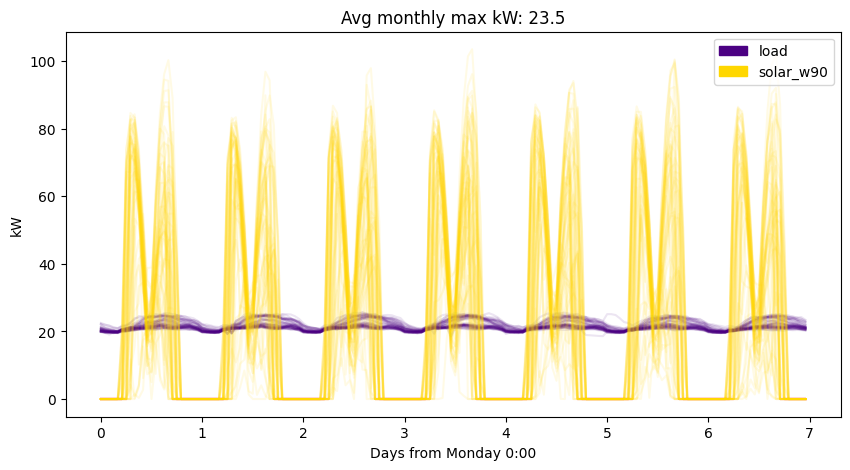

In [13]:
l = df['load']
s = df['solar_w90']
avg_monthly_max = (l - s).resample('1M').max().mean()  
plot_weekly((l,s),f'Avg monthly max kW: {avg_monthly_max:.1f}',ylabel='kW')

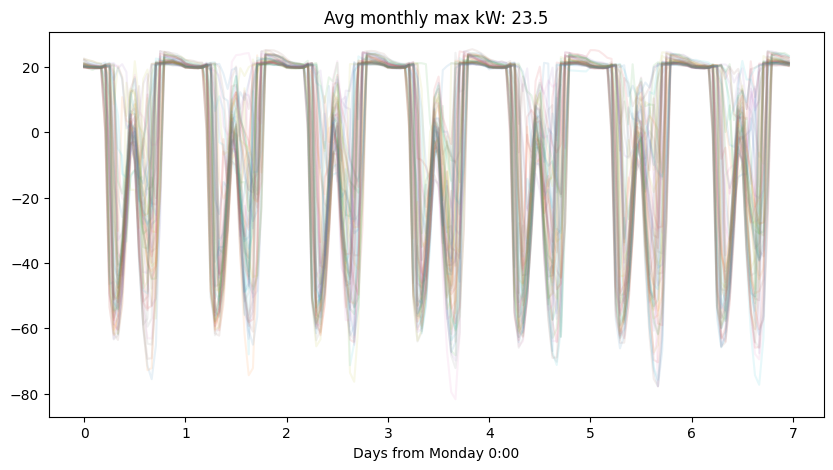

In [14]:
l = df['load']
s = df['solar_w90']
avg_monthly_max = (l - s).resample('1M').max().mean()  
plot_weekly(l-s,f'Avg monthly max kW: {avg_monthly_max:.1f}',ylabel='kW')

load v s20w90

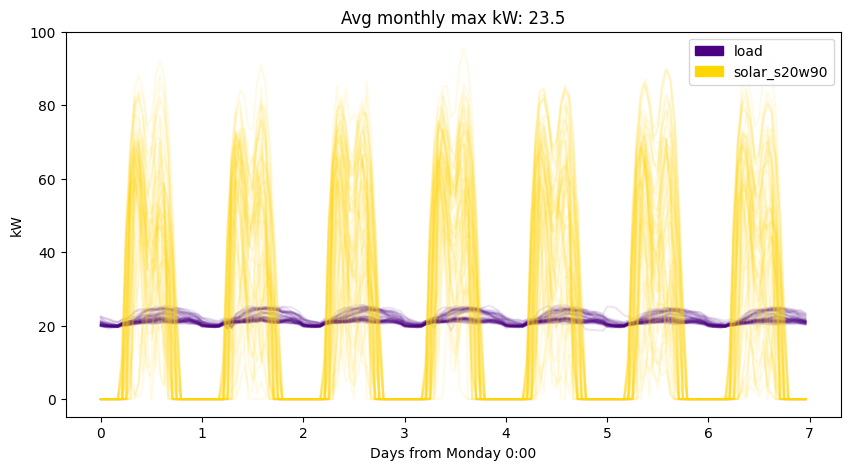

In [15]:
l = df['load']
s = df['solar_s20w90']
avg_monthly_max = (l - s).resample('1M').max().mean()  
plot_weekly((l,s),f'Avg monthly max kW: {avg_monthly_max:.1f}',ylabel='kW')

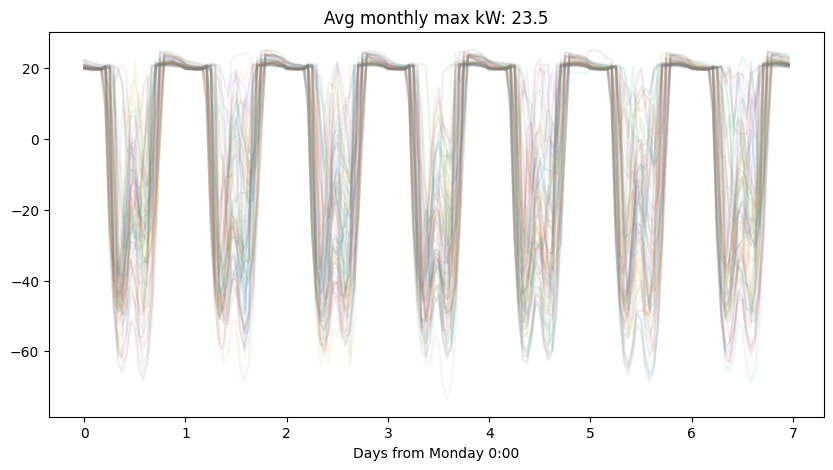

In [16]:
l = df['load']
s = df['solar_s20w90']
avg_monthly_max = (l - s).resample('1M').max().mean()  
plot_weekly(l-s,f'Avg monthly max kW: {avg_monthly_max:.1f}',ylabel='kW')

# Monthly peaks

## Single TOU

In [17]:
peak_begin,peak_end = 8,11
angle = 's20'
peaks = calc_monthly_peaks(df[f'netload_{angle}'],peak_begin,peak_end)

angle = 'w20'
peaks = pd.concat((peaks,calc_monthly_peaks(df[f'netload_{angle}'],peak_begin,peak_end)),axis=1)
peaks[f'netload_s20->{angle} reduc kw'] = peaks['netload_s20 kw'] - peaks[f'netload_{angle} kw']

angle = 'w90'
peaks = pd.concat((peaks,calc_monthly_peaks(df[f'netload_{angle}'],peak_begin,peak_end)),axis=1)
peaks[f'netload_s20->{angle} reduc kw'] = peaks['netload_s20 kw'] - peaks[f'netload_{angle} kw']

angle = 's20w90'
peaks = pd.concat((peaks,calc_monthly_peaks(df[f'netload_{angle}'],peak_begin,peak_end)),axis=1)
peaks[f'netload_s20->{angle} reduc kw'] = peaks['netload_s20 kw'] - peaks[f'netload_{angle} kw']

print('Avg w20 reduction',peaks['netload_s20->w20 reduc kw'].mean())
print('Avg w90 reduction',peaks['netload_s20->w90 reduc kw'].mean())
print('Avg s20w90 reduction',peaks['netload_s20->s20w90 reduc kw'].mean())
peaks

Avg w20 reduction 3.35
Avg w90 reduction 5.125
Avg s20w90 reduction 3.6750000000000007


,netload_s20 kw,netload_s20 t,netload_w20 kw,netload_w20 t,netload_s20->w20 reduc kw,netload_w90 kw,netload_w90 t,netload_s20->w90 reduc kw,netload_s20w90 kw,netload_s20w90 t,netload_s20->s20w90 reduc kw
1,21.1,2022-01-20 08:00:00,21.1,2022-01-20 08:00:00,0.0,21.1,2022-01-20 08:00:00,0.0,21.1,2022-01-20 08:00:00,0.0
2,20.7,2022-02-06 08:00:00,20.7,2022-02-06 08:00:00,0.0,20.7,2022-02-06 08:00:00,0.0,20.7,2022-02-06 08:00:00,0.0
3,12.3,2022-03-09 08:00:00,12.3,2022-03-09 08:00:00,0.0,14.1,2022-03-09 08:00:00,-1.8,13.2,2022-03-09 08:00:00,-0.9
4,17.9,2022-04-13 08:00:00,17.9,2022-04-13 08:00:00,0.0,18.9,2022-04-13 08:00:00,-1.0,18.4,2022-04-13 08:00:00,-0.5
5,11.0,2022-05-30 10:00:00,8.8,2022-05-17 08:00:00,2.2,11.0,2022-05-17 08:00:00,0.0,9.9,2022-05-17 08:00:00,1.1
6,-9.3,2022-06-14 10:00:00,-11.4,2022-06-28 08:00:00,2.1,-5.1,2022-06-28 10:00:00,-4.2,-10.2,2022-06-28 10:00:00,0.9
7,22.3,2022-07-05 10:00:00,17.9,2022-07-05 10:00:00,4.4,-2.4,2022-07-23 09:00:00,24.7,9.4,2022-07-05 10:00:00,12.9
8,20.5,2022-08-24 10:00:00,6.9,2022-08-26 10:00:00,13.6,8.2,2022-08-21 09:00:00,12.3,6.9,2022-08-21 09:00:00,13.6
9,21.8,2022-09-03 10:00:00,3.9,2022-09-03 10:00:00,17.9,-9.8,2022-09-25 10:00:00,31.6,4.6,2022-09-03 10:00:00,17.2
10,20.8,2022-10-30 09:00:00,20.8,2022-10-30 09:00:00,0.0,20.8,2022-10-30 09:00:00,0.0,20.8,2022-10-30 09:00:00,0.0


## Variable TOU

w20

In [18]:
angle1 = 's20'
angle2 = 'w20'

peak_reduc_v_TOU = net_load_peak_reduction_variable_TOU(df,angle1,angle2)
peak_reduc_v_TOU[peak_reduc_v_TOU['avg peak reduction [kW]']>0.2]

,TOU begin [h],TOU end [h],max peak reduction [kW],avg peak reduction [kW],min peak reduction [kW]
1,8,11,17.9,3.4,0.0
2,8,12,8.0,1.9,0.0
3,8,13,3.4,0.6,0.0
8,8,18,2.8,0.3,0.0
9,8,19,6.2,0.6,0.0
12,9,11,17.9,3.8,-0.8
13,9,12,8.0,2.2,-0.8
14,9,13,5.9,0.9,-0.1
19,9,18,2.8,0.3,0.0
20,9,19,6.2,0.6,0.0


w90

In [19]:
angle1 = 's20'
angle2 = 'w90'

peak_reduc_v_TOU = net_load_peak_reduction_variable_TOU(df,angle1,angle2)
peak_reduc_v_TOU[peak_reduc_v_TOU['avg peak reduction [kW]']>0.2]

,TOU begin [h],TOU end [h],max peak reduction [kW],avg peak reduction [kW],min peak reduction [kW]
0,8,10,19.3,2.4,-2.5
1,8,11,31.6,5.1,-4.2
2,8,12,9.5,0.3,-14.5
4,8,14,9.6,0.3,-9.2
7,8,17,9.6,0.3,-9.2
9,8,19,4.8,0.5,0.0
12,9,11,31.6,5.1,-4.2
15,9,14,9.6,0.3,-9.2
18,9,17,9.6,0.4,-9.2
20,9,19,4.8,0.5,0.0


s20w90

In [20]:
angle1 = 's20'
angle2 = 's20w90'

peak_reduc_v_TOU = net_load_peak_reduction_variable_TOU(df,angle1,angle2)
peak_reduc_v_TOU[peak_reduc_v_TOU['avg peak reduction [kW]']>0.2]

,TOU begin [h],TOU end [h],max peak reduction [kW],avg peak reduction [kW],min peak reduction [kW]
0,8,10,15.6,2.4,-1.2
1,8,11,17.2,3.7,-0.9
2,8,12,5.7,0.5,-4.3
3,8,13,4.7,0.6,-0.9
4,8,14,4.9,0.6,-0.9
5,8,15,4.9,0.4,-0.9
6,8,16,4.9,0.5,-0.9
7,8,17,4.9,0.5,-0.9
8,8,18,2.2,0.4,-0.1
9,8,19,6.7,0.6,0.0


Best for w90

In [21]:
#df.loc['2022-6-28':'2022-6-30'][['load','solar_s20','solar_w90','solar_s20w90']].plot()

In [22]:
#df.loc['2022-3-5':'2022-3-7'][['load','solar_s20','solar_w90','solar_s20w90']].plot()

Largest spread w90 v s20w90

In [23]:
#df.loc['2022-10-12':'2022-10-14'][['load','solar_s20','solar_w90','solar_s20w90']].plot()

# Peak shaving

## Technical

More or less technical peak shaving doesn't benefit from bifacial, I think because if you're trying to shave the entire day you benefit more from the greater kWh produced by s20 than any of the other angles.

### Single angle

In [26]:
angle = 's20'
threshold = 20
batt_kwh_max = 500
tou_h = list(range(24))

batt_kwh,dispatch = find_smallest_soe0(df,f'netload_{angle}',threshold,batt_kwh_max,tou_h,)

plotly_stacked(dispatch,
               solar=f'solar_{angle}',
               title=f'Treshold kW = {threshold}, TOU = {tou_h[0]}-{tou_h[-1]}, '+\
                     f'Solar = {angle} <br>Battery kWh = {batt_kwh:.1f}')

Solution found: netload_s20, Threshold kw = 20.0, Battery kWh = 59.0,


### Several angles

In [27]:
threshold = 20
batt_kwh_max = 70
TOU_hours = list(range(24))

results = pd.DataFrame([],columns=['batt_kwh','dispatch'],index=solar_angles)
for angle in solar_angles:
    df2 = df.copy(deep=True)
    batt_kwh,dispatch = find_smallest_soe0(df,
                                            f'netload_{angle}',
                                            threshold,
                                            batt_kwh_max,
                                            TOU_hours)
    results.loc[angle,:] = [batt_kwh,dispatch]
results

Solution found: netload_s20, Threshold kw = 20.0, Battery kWh = 59.0,
Solution found: netload_w20, Threshold kw = 20.0, Battery kWh = 53.0,
Solution found: netload_w90, Threshold kw = 20.0, Battery kWh = 53.0,
Solution found: netload_s20w90, Threshold kw = 20.0, Battery kWh = 53.0,


,batt_kwh,dispatch
s20,59,load solar_s20 solar...
w20,53,load solar_s20 solar...
w90,53,load solar_s20 solar...
s20w90,53,load solar_s20 solar...


s20

In [28]:
angle = 's20'

batt_kwh = results.batt_kwh[angle]
dispatch = results.dispatch[angle]
plotly_stacked(dispatch,#.loc['2022-8-25':'2022-8-27'],
               solar='solar_'+angle,
               title=f'Threshold kW = {threshold}, Peak TOU = {TOU_hours[0]}:00-{1+TOU_hours[-1]}:00, '+\
                     f'Solar = {angle} <br>Battery kWh = {batt_kwh:.1f}')

w90

In [29]:
angle = 'w90'

batt_kwh = results.batt_kwh[angle]
dispatch = results.dispatch[angle]
plotly_stacked(dispatch,#.loc['2022-8-25':'2022-8-27'],
               solar='solar_'+angle,
               title=f'Threshold kW = {threshold}, Peak TOU = {TOU_hours[0]}:00-{1+TOU_hours[-1]}:00, '+\
                     f'Solar = {angle} <br>Battery kWh = {batt_kwh:.1f}')

## Economic

### Single angle

In [30]:
threshold = 0
batt_kwh_max = 500
angle = 's20'
tou_h = list(range(16,21))

batt_kwh,dispatch = find_smallest_soe0(df,f'netload_{angle}',threshold,batt_kwh_max,tou_h,)

plotly_stacked(dispatch,
               solar=f'solar_{angle}',
               title=f'Treshold kW = {threshold}, TOU = {TOU_hours[0]}-{TOU_hours[-1]}, '+\
                     f'Solar = {angle} <br>Battery kWh = {batt_kwh:.1f}')

Solution found: netload_s20, Threshold kw = 0.0, Battery kWh = 368.0,


### Several angles

In [31]:
threshold = 0
batt_kwh_max = 400
TOU_hours = list(range(16,21))

results = pd.DataFrame([],columns=['batt_kwh','dispatch'],index=solar_angles)
for angle in solar_angles:
    df2 = df.copy(deep=True)
    batt_kwh,dispatch = find_smallest_soe0(df,
                                            f'netload_{angle}',
                                            threshold,
                                            batt_kwh_max,
                                            TOU_hours)
    results.loc[angle,:] = [batt_kwh,dispatch]
results

Solution found: netload_s20, Threshold kw = 0.0, Battery kWh = 368.0,
Failed on first battery size, try 1.1x
Failed on first battery size, try 2x
Solution found: netload_w20, Threshold kw = 0.0, Battery kWh = 611.0,
Failed on first battery size, try 1.1x
Failed on first battery size, try 2x
Solution found: netload_w90, Threshold kw = 0.0, Battery kWh = 696.0,
Failed on first battery size, try 1.1x
Solution found: netload_s20w90, Threshold kw = 0.0, Battery kWh = 439.0,


,batt_kwh,dispatch
s20,368,load solar_s20 solar...
w20,611,load solar_s20 solar...
w90,696,load solar_s20 solar...
s20w90,439,load solar_s20 solar...


s20

In [32]:
angle = 's20'

batt_kwh = results.batt_kwh[angle]
dispatch = results.dispatch[angle]
plotly_stacked(dispatch,#.loc['2022-8-25':'2022-8-27'],
               solar='solar_'+angle,
               title=f'Threshold kW = {threshold}, Peak TOU = {TOU_hours[0]}:00-{1+TOU_hours[-1]}:00, '+\
                     f'Solar = {angle} <br>Battery kWh = {batt_kwh:.1f}')

w90

In [33]:
angle = 'w90'

batt_kwh = results.batt_kwh[angle]
dispatch = results.dispatch[angle]
plotly_stacked(dispatch,#.loc['2022-8-25':'2022-8-27'],
               solar='solar_'+angle,
               title=f'Threshold kW = {threshold}, Peak TOU = {TOU_hours[0]}:00-{1+TOU_hours[-1]}:00, '+\
                     f'Solar = {angle} <br>Battery kWh = {batt_kwh:.1f}')